# Project 1
Team Members:
- Thiago Viegas (tjv235)
- Diego Rosenberg (dr3432)


## Question 1

In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from matplotlib import scale
from matplotlib.gridspec import GridSpec
import os
import json

colors = ('r','g','b')


from google.colab import drive
try:
    drive.mount('/content/drive')
except ValueError as e:
    print(f"Error mounting Google Drive: {e}")


data_folder = "/content/drive/MyDrive/Fall 2025/CS-GY 6643 Computer Vision/Project 1"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
def calculate_histogram(image):
    rgb_hist = []
    for i, color in enumerate(colors):
        rgb_hist.append(cv.calcHist([image], [i], None, [256], [0, 256]))

    return rgb_hist

In [3]:
def equalize_image(image):
    # First, converting image to yCbCr
    image_yCbCr = cv.cvtColor(image, cv.COLOR_RGB2YCrCb)

    # Apply Histogram Equalization
    image_yCbCr[:,:,0] = cv.equalizeHist(image_yCbCr[:,:,0])

    # Convert back to BGR
    equalized_image = cv.cvtColor(image_yCbCr, cv.COLOR_YCrCb2RGB)

    return equalized_image

In [4]:
# Q1 File Locations
q1_folder = "Question1&2"
current_histogram_file = "current_histogram.png"
tampered_nebula_image_file = "heic2007a_tampered_RB_right_Ggray (1).png"
proper_histogram_file = "histogram proper.png"

current_histogram_file_path = os.path.join(data_folder, q1_folder, current_histogram_file)
tampered_nebula_image_file_path = os.path.join(data_folder, q1_folder, tampered_nebula_image_file)
proper_histogram_file_path = os.path.join(data_folder, q1_folder, proper_histogram_file)

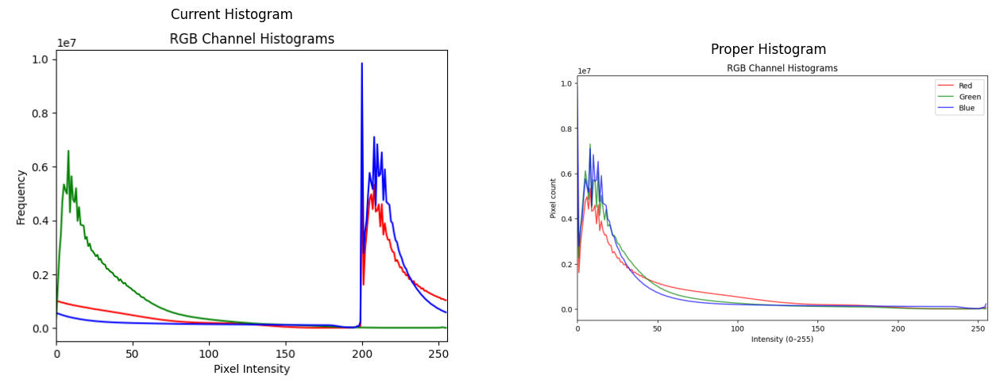

In [5]:
curr_histogram = cv.cvtColor(cv.imread(current_histogram_file_path), cv.COLOR_BGR2RGB)
proper_histogram = cv.cvtColor(cv.imread(proper_histogram_file_path), cv.COLOR_BGR2RGB)

fig, axs = plt.subplots(1,2, figsize=(16,8))
axs[0].imshow(curr_histogram)
axs[0].set_title("Current Histogram")
axs[0].axis('off')

axs[1].imshow(proper_histogram)
axs[1].set_title("Proper Histogram")
axs[1].axis('off')
plt.show()

In [6]:
# Save a little of memory
del(curr_histogram)
del(proper_histogram)

In [7]:
image = cv.cvtColor(cv.imread(tampered_nebula_image_file_path), cv.COLOR_BGR2RGB)
image.shape

(11710, 17043, 3)

In [8]:
# First reduce 200 from the
np_subtraction_array = np.zeros_like(image, dtype=np.uint8)
np_subtraction_array[:,:,0] = 200
np_subtraction_array[:,:,2] = 200

# Np subtract is a modulo operation while cv.subtract is "saturation" operation.
#   In this case we want to use the modulo operation as we want values smaller than 200 to wrap around while values above 200 are simply subtracted.
#   Given this we could either create our own lookup table or simply use the np operation.
subtracted_img = np.subtract(image, np_subtraction_array)

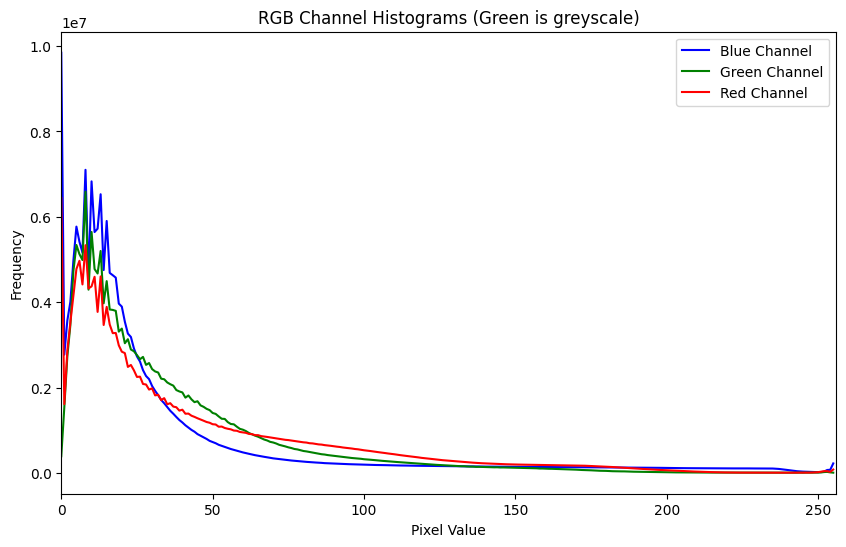

In [9]:
red_hist, green_hist, blue_hist = calculate_histogram(subtracted_img)

# Plot all in one graph
plt.figure(figsize=(10, 6))
plt.plot(blue_hist, color='blue', label='Blue Channel')
plt.plot(green_hist, color='green', label='Green Channel')
plt.plot(red_hist, color='red', label='Red Channel')
plt.xlim([0, 256])
plt.title('RGB Channel Histograms (Green is greyscale)')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()

The most common method for converting a color image to greyscale is utilizing the luminosity formula. This formula will have the following equation:
$$ Gray=0.299\times R+0.587\times G+0.114\times B $$

Therefore converting from greyscale and Red and Blue back go green we can simply use:
$$G = \frac{Gray - 0.299\times R - 0.114\times B}{0.587}$$


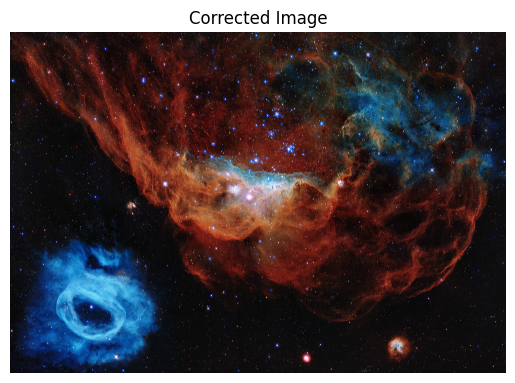

In [10]:
# Applying the formula above:
red_channel = subtracted_img[:,:,0]
blue_channel = subtracted_img[:,:,2]
gray_channel = subtracted_img[:,:,1]

# Perform operations on float data type due to division and multiplication of decimal numbers
corrected_img = np.zeros_like(subtracted_img, dtype=np.float32)
corrected_img[:,:,2] = blue_channel
corrected_img[:,:,0] = red_channel
corrected_img[:,:,1] = (gray_channel - 0.299*red_channel - 0.114*blue_channel)/0.587

# Convert back to uint8
corrected_img = np.clip(corrected_img, 0, 255).astype(np.uint8)

# Show corrected image
plt.imshow(corrected_img)
plt.title('Corrected Image')
plt.axis('off')
plt.show()

In [11]:
del(subtracted_img)

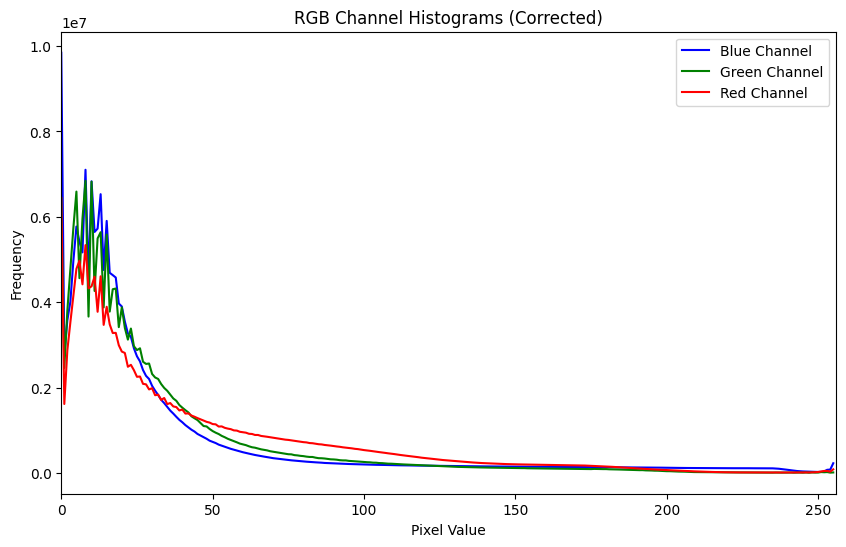

In [12]:
red_hist, green_hist, blue_hist = calculate_histogram(corrected_img)

# Plot all in one graph
plt.figure(figsize=(10, 6))
plt.plot(blue_hist, color='blue', label='Blue Channel')
plt.plot(green_hist, color='green', label='Green Channel')
plt.plot(red_hist, color='red', label='Red Channel')
plt.xlim([0, 256])
plt.title('RGB Channel Histograms (Corrected)')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()

We can observe that both graphs are extremely similar and therefore we can state that we have correctly corrected for the sifts and greyscale mistakes that had been made to the original image.

---

## Question 2

Histogram equalization is a non-linear process and channel splitting and equalizing each channel separately will not return the result that we want. Therefore, to equalize a simple RGB image we need to transfer the RBG image into a different type of color space so that we can manipulate the intensity values without disturbing the color balance of the image.

One of these possible color space options are YCbCr (according to google it is one of the perfered options since it is designed for digital cameras).

Once in the YCbCr space, we can equalize on the Y plane and then reconvert back to RGB.

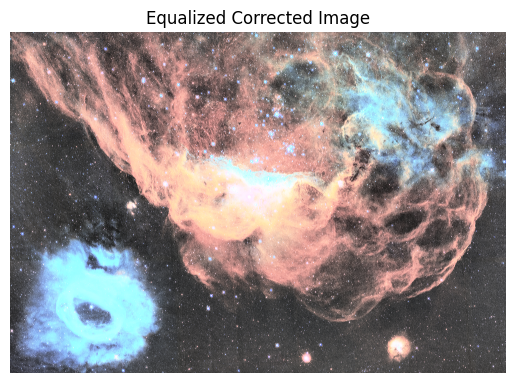

In [13]:
equalized_corrected_image = equalize_image(corrected_img)

# Display corrected image
plt.imshow(equalized_corrected_image)
plt.title('Equalized Corrected Image')
plt.axis('off')
plt.show()

We will try two thresholding techniques here and apply over both images.
- A constant threshold (set to 150)
- And an adaptive threshold. (using a Gaussian Threshold)

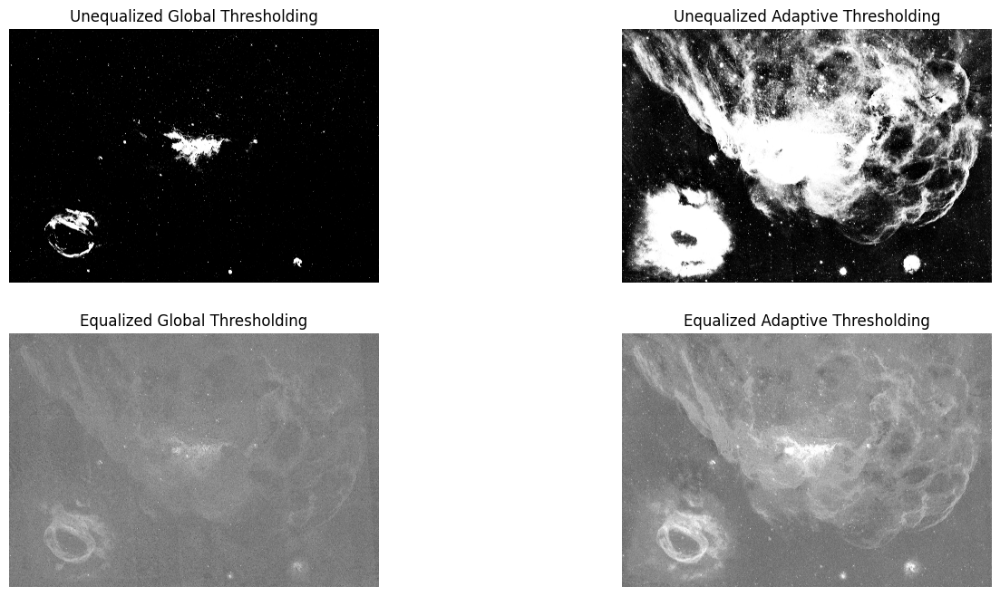

In [14]:
# Set constant threshold value
threshold = 150

grayscale_img = cv.cvtColor(corrected_img, cv.COLOR_RGB2GRAY)
_, thresholded_image = cv.threshold(grayscale_img, threshold, 255, cv.THRESH_BINARY)
adaptive_thresholded_image = cv.adaptiveThreshold(grayscale_img, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 11, 2)

equalized_grayscale_img = cv.cvtColor(equalized_corrected_image, cv.COLOR_RGB2GRAY)
_, thresholded_equalized_image = cv.threshold(equalized_grayscale_img, threshold, 255, cv.THRESH_BINARY)
adaptive_thresholded_equalized_image = cv.adaptiveThreshold(equalized_grayscale_img, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 11, 2)

# Thresholded images with and without equialization
fig, axs = plt.subplots(2,2, figsize=(16,8))
axs[0, 0].imshow(thresholded_image, cmap='gray')
axs[0, 0].set_title("Unequalized Global Thresholding")
axs[0, 0].axis('off')

axs[0, 1].imshow(thresholded_equalized_image, cmap='gray')
axs[0, 1].set_title("Unequalized Adaptive Thresholding")
axs[0, 1].axis('off')

axs[1, 0].imshow(adaptive_thresholded_image, cmap='gray')
axs[1, 0].set_title("Equalized Global Thresholding")
axs[1, 0].axis('off')

axs[1, 1].imshow(adaptive_thresholded_equalized_image, cmap='gray')
axs[1, 1].set_title("Equalized Adaptive Thresholding")
axs[1, 1].axis('off')
plt.show()

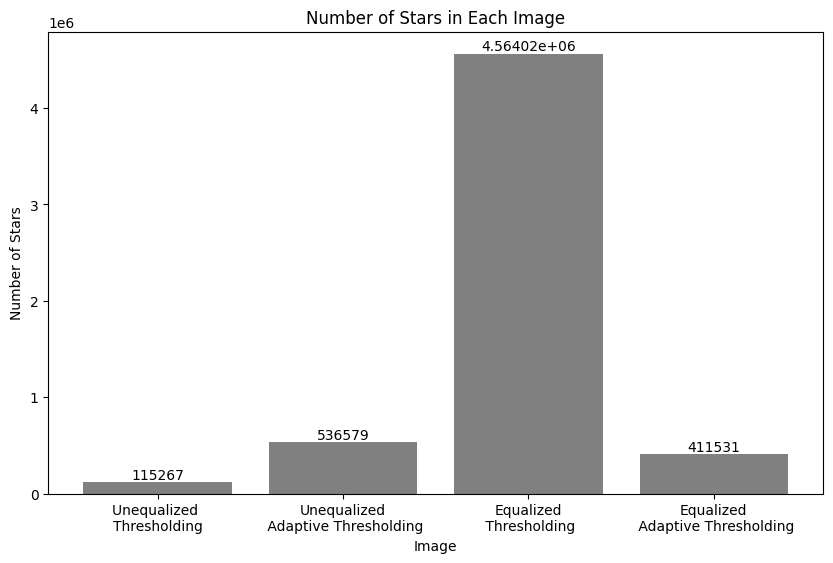

In [15]:
# For each image count the number of stars using cv.connectedComponents
#   Remember to remove 1 from total since one label is the background.

n_stars_thresholded_image = cv.connectedComponents(thresholded_image)[0] - 1
n_stars_adaptive_thresholded_image = cv.connectedComponents(adaptive_thresholded_image)[0] - 1
n_stars_thresholded_equalized_image = cv.connectedComponents(thresholded_equalized_image)[0] - 1
n_stars_adaptive_thresholded_equalized_image = cv.connectedComponents(adaptive_thresholded_equalized_image)[0] - 1

labels = ['Unequalized \nThresholding', 'Unequalized\n Adaptive Thresholding', 'Equalized\n Thresholding', 'Equalized\n Adaptive Thresholding']
bars = [n_stars_thresholded_image, n_stars_adaptive_thresholded_image, n_stars_thresholded_equalized_image, n_stars_adaptive_thresholded_equalized_image]
# Single barplot for all 4 results:
plt.figure(figsize=(10, 6))
plt.bar(labels, bars, color='grey', label='Unequalized')
plt.title('Number of Stars in Each Image')
plt.xlabel('Image')
plt.ylabel('Number of Stars')
plt.bar_label(plt.gca().containers[0])
plt.show()

**Comparing Results:**
Overall pixel equalization clearly has a negative impact on the ability to count stars. Pixel equalization negatively affects three key aspects utilized in star counting:
- Star counting through this method looks for the pixel intensity distribution to be wide, as the dark background of the universe contrasts to the brightness of the individual stars. Equalization normalizes pixel values and has a negative effect on counting stars.
- Similarly, equalization normalizes the brightness distribution, lowering hte contrast of the image and making it more difficult to threshold stars in a more consitent brighness tone.
- Lastly, in bright spots, such as the large red and blue nebulas, pixel equalization increases the amount of noise produced by the bright red and blue nebula and completely clouds the entire arae. The noise creates a more difficult environment for stars to be observed and creates a more difficult counting problem.

What is likely the best performant model in this case would be the unequalized adaptive thresholding. The high contrast in pixel brightness and the more flexible thresholding more likely allows it to capture the full nebula as one entity and tehn count the other stars it finds.


However, this still counts too many stars so we will attempt to add some additional filters to create a better estimation of how many stars there are in the image. We will first convert the image to grayscale, apply a gausssian blur in order to remove noise, apply a global treshold (as that worked much better), and then utilize a contour function (this function was suggested to us by AI) in open CV to count the "blobs" of stars in the image in order to get an accurate picture. With those contours we can then count the number of resulting stars.



Number of stars detected: 5478


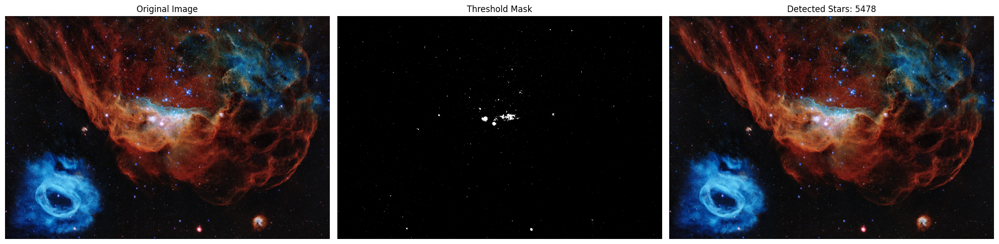

In [16]:
# Convert to Grayscale
gray = cv.cvtColor(corrected_img, cv.COLOR_RGB2GRAY)

# Apply a Median Blur
blurred = cv.medianBlur(gray, 5)

# Apply a Binary Threshold
treshold = 180
_, thresh = cv.threshold(blurred, 200, 255, cv.THRESH_BINARY)

# Find Contours
contours, _ = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Create a copy of the original image to draw on
output_image = corrected_img.copy()
star_count = 0

# Filter Contours by Area and Count
for c in contours:
    # Calculate the area of the contour
    area = cv.contourArea(c)

    # Filter out objects that are too small (noise) or too large (nebulae parts)
    # Adjust the min_area and max_area values as needed.
    min_area = 2.0
    max_area = 150.0

    if min_area < area < max_area:
        star_count += 1
        # Draw a  green dot at each detected star on the output image
        (x, y), radius = cv.minEnclosingCircle(c)
        center = (int(x), int(y))
        radius = int(radius) + 2 # Add a small buffer to the radius
        cv.circle(output_image, center, radius, (0, 255, 0), -1)

print(f"Number of stars detected: {star_count}")

# Display the results
plt.figure(figsize=(20, 10))

plt.subplot(1, 3, 1)
plt.imshow(corrected_img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(thresh, cmap='gray')
plt.title('Threshold Mask')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(output_image)
plt.title(f'Detected Stars: {star_count}')
plt.axis('off')

plt.tight_layout()
plt.show()

This detection does a much better job of removing noisse in the image. The combinmation of the bluring, high threshold and the limiting of teh area (in iorder not to count the large nebula) are a great way to approximate the number of stars in teh image. The number of ~5k stars seems to be a good approximation as a long exposure image of the sky should have a couple of thousand stars in it, making this a valid potential estimate.


In [17]:
del(thresholded_image)
del(adaptive_thresholded_image)
del(thresholded_equalized_image)
del(adaptive_thresholded_equalized_image)

# Delete plots
plt.close('all')


---

## Question 3


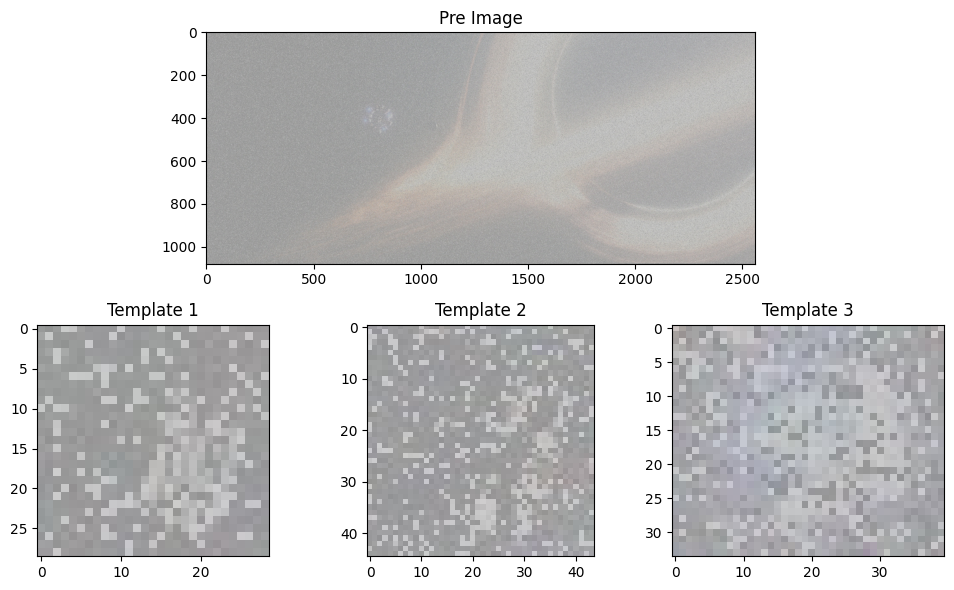

In [18]:
q3_folder = "Question3"
pre_image_file = "pre_img.jpg"
pre_template1_file = "pre_template_001.jpg"
pre_template2_file = "pre_template_002.jpg"
pre_template3_file = "pre_template_003.jpg"

pre_image_file_path = os.path.join(data_folder, q3_folder, pre_image_file)
pre_template1_path = os.path.join(data_folder, q3_folder, pre_template1_file)
pre_template2_path = os.path.join(data_folder, q3_folder, pre_template2_file)
pre_template3_path = os.path.join(data_folder, q3_folder, pre_template3_file)

pre_image_img = cv.cvtColor(cv.imread(pre_image_file_path), cv.COLOR_BGR2RGB)
temp_001_img = cv.cvtColor(cv.imread(pre_template1_path), cv.COLOR_BGR2RGB)
temp_002_img = cv.cvtColor(cv.imread(pre_template2_path), cv.COLOR_BGR2RGB)
temp_003_img = cv.cvtColor(cv.imread(pre_template3_path), cv.COLOR_BGR2RGB)

# Create a figure
fig = plt.figure(figsize=(10, 6))

# Define the grid. The layout will be 2 rows and 3 columns,
# with the top subplot spanning all 3 columns.
gs = GridSpec(2, 3, figure=fig)

# Add the main, wide subplot in the top row (spans all columns)
ax1 = fig.add_subplot(gs[0, :])
ax1.imshow(pre_image_img)
ax1.set_title('Pre Image')

# Add the smaller subplots in the second row
ax2 = fig.add_subplot(gs[1, 0])
ax2.imshow(temp_001_img)
ax2.set_title('Template 1')

ax3 = fig.add_subplot(gs[1, 1])
ax3.imshow(temp_002_img)
ax3.set_title('Template 2')

ax4 = fig.add_subplot(gs[1, 2])
ax4.imshow(temp_003_img)
ax4.set_title('Template 3')

# Use `constrained_layout` or `tight_layout` to prevent titles from overlapping
fig.tight_layout()

# Display the plot
plt.show()

We applied two techniques to see which denoising technique would work best.
1. Median blur to remove Gaussian Noise
2. Utilized a fast non local mean denoising algorithm implemented in cv (this was suggested by googling and AIs when prompted also proposed this as a potential solution).
3. Apply Gaussian blur to see if it is more performant.
4. Apply a Gaussian blur to the median denoised image to see if there is additional performance to be gained.
5. Apply a Gaussian blur with a larger kernel size to the median denoised image to see if ti workes best.
6. Apply fastNL Means Denoising to the median denoised image to see if there are improvements.



In [19]:
# The "Pre Image" is already loaded as pre_image_img

# Apply Median Blur
median_denoised_img = cv.medianBlur(pre_image_img, 5) # Kernel size 5x5

# Apply Non-local Means Denoising function from CV
    # Parameters: h (filter strength), hForColorComponents (same as h for color images),
    # templateWindowSize (size of the pixel neighborhood used to calculate the weighted average),
    # searchWindowSize (size of the search window)
non_local_denoised_img = cv.fastNlMeansDenoisingColored(pre_image_img, None, 10, 10, 7, 21)

#Apply gausian denoising
gaussian_denoised_img = cv.GaussianBlur(pre_image_img, (5, 5), 0)

median_and_gaussian_denoised_img = cv.GaussianBlur(median_denoised_img, (5, 5), 0)

#increase kernel size
large_kernel_median_and_gaussian_denoised_img = cv.GaussianBlur(median_denoised_img, (9, 9), 0)

median_and_non_local_denoised_img = cv.fastNlMeansDenoisingColored(median_denoised_img, None, 10, 10, 7, 21)

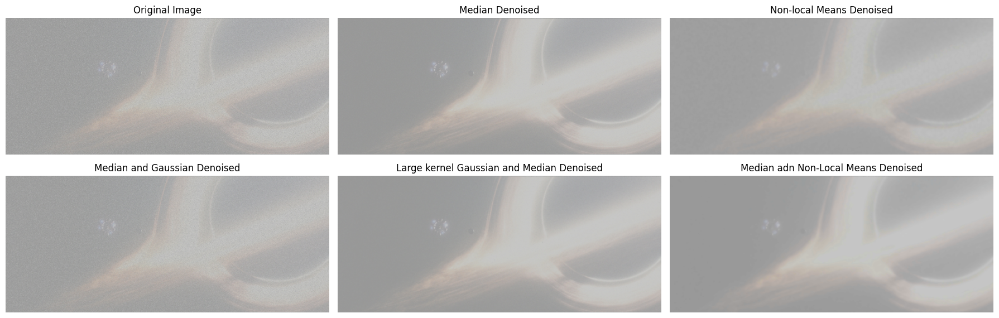

In [20]:
# Create a figure with subplots
fig, axs = plt.subplots(2, 3, figsize=(18, 6))

# Display the original image
axs[0][0].imshow(pre_image_img)
axs[0][0].set_title("Original Image")
axs[0][0].axis('off')

# Display the median denoised image
axs[0][1].imshow(median_denoised_img)
axs[0][1].set_title("Median Denoised")
axs[0][1].axis('off')

# Display the non-local means denoised image
axs[0][2].imshow(non_local_denoised_img)
axs[0][2].set_title("Non-local Means Denoised")
axs[0][2].axis('off')

axs[1][0].imshow(gaussian_denoised_img)
axs[1][0].set_title("Median and Gaussian Denoised")
axs[1][0].axis('off')

# Display the median denoised image
axs[1][1].imshow(large_kernel_median_and_gaussian_denoised_img)
axs[1][1].set_title("Large kernel Gaussian and Median Denoised")
axs[1][1].axis('off')

# Display the non-local means denoised image
axs[1][2].imshow(median_and_non_local_denoised_img)
axs[1][2].set_title("Median adn Non-Local Means Denoised")
axs[1][2].axis('off')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

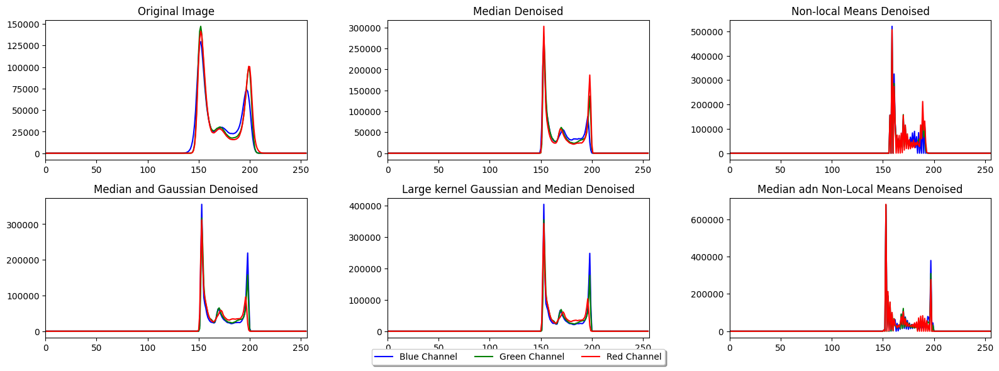

In [21]:
# View Image rgb channel histograms
red_hist, green_hist, blue_hist = calculate_histogram(pre_image_img)
red_hist_median, green_hist_median, blue_hist_median = calculate_histogram(median_denoised_img)
red_hist_non_local, green_hist_non_local, blue_hist_non_local = calculate_histogram(non_local_denoised_img)

red_hist_mgd, green_hist_mgd, blue_hist_mgd = calculate_histogram(median_and_gaussian_denoised_img)
red_hist_lkmgd, green_hist_lkmgd, blue_hist_lkmgd = calculate_histogram(large_kernel_median_and_gaussian_denoised_img)
red_hist_mnld, green_hist_mnld, blue_hist_mnld = calculate_histogram(median_and_non_local_denoised_img)


# Create a figure with subplots
fig, ax = plt.subplots(2, 3, figsize=(16, 6))

ax[0][0].plot(blue_hist, color='blue', label='Blue Channel')
ax[0][0].plot(green_hist, color='green', label='Green Channel')
ax[0][0].plot(red_hist, color='red', label='Red Channel')
ax[0][0].set_title("Original Image")
ax[0][0].set_xlim([0, 256])

ax[0][1].plot(blue_hist_median, color='blue', label='Blue Channel')
ax[0][1].plot(green_hist_median, color='green', label='Green Channel')
ax[0][1].plot(red_hist_median, color='red', label='Red Channel')
ax[0][1].set_title("Median Denoised")
ax[0][1].set_xlim([0, 256])

ax[0][2].plot(blue_hist_non_local, color='blue', label='Blue Channel')
ax[0][2].plot(green_hist_non_local, color='green', label='Green Channel')
ax[0][2].plot(red_hist_non_local, color='red', label='Red Channel')
ax[0][2].set_title("Non-local Means Denoised")
ax[0][2].set_xlim([0, 256])

ax[1][0].plot(red_hist_mgd, color='blue', label='Blue Channel')
ax[1][0].plot(green_hist_mgd, color='green', label='Green Channel')
ax[1][0].plot(blue_hist_mgd, color='red', label='Red Channel')
ax[1][0].set_title("Median and Gaussian Denoised")
ax[1][0].set_xlim([0, 256])

ax[1][1].plot(red_hist_lkmgd, color='blue', label='Blue Channel')
ax[1][1].plot(green_hist_lkmgd, color='green', label='Green Channel')
ax[1][1].plot(blue_hist_lkmgd, color='red', label='Red Channel')
ax[1][1].set_title("Large kernel Gaussian and Median Denoised")
ax[1][1].set_xlim([0, 256])

ax[1][2].plot(red_hist_mnld, color='blue', label='Blue Channel')
ax[1][2].plot(green_hist_mnld, color='green', label='Green Channel')
ax[1][2].plot(blue_hist_mnld, color='red', label='Red Channel')
ax[1][2].set_title("Median adn Non-Local Means Denoised")
ax[1][2].set_xlim([0, 256])


ax[1][1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=5)
# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

From the images and the histograms it apparent that the Non-Local Means denoised amplify teh noise and create a lot of peaks in the distribution while median and gaussian denoised images create a better looking picture. Particularly, the **large kernel Gaussian bluring combined with the median bluring** seem to have the best effect on the images creating a beter resulting image.

Given this, our base filter going forward will be the median blur filter followed by a large kernel (9,9) Guaussian blur.

In [22]:
def contrast_stretch_rgb(img_rgb, low_pct=2, high_pct=98):
    # convert RGB → YCrCb
    ycc = cv.cvtColor(img_rgb, cv.COLOR_RGB2YCrCb)
    Y, Cr, Cb = cv.split(ycc)

    Yf = Y.astype(np.float32)
    p1, p2 = np.percentile(Yf, (low_pct, high_pct))
    a = 255.0 / max(p2 - p1, 1e-6)
    b = -a * p1

    Ys = np.clip(a * Yf + b, 0, 255).astype(np.uint8)
    out = cv.merge((Ys, Cr, Cb))
    # back to RGB
    return cv.cvtColor(out, cv.COLOR_YCrCb2RGB)

def boost_saturation_rgb(img_rgb, s_gain=1.25, v_gain=1.0):
    hsv = cv.cvtColor(img_rgb, cv.COLOR_RGB2HSV).astype(np.float32)
    hsv[...,1] *= s_gain   # saturation
    hsv[...,2] *= v_gain   # optional: brightness
    hsv[...,1:] = np.clip(hsv[...,1:], 0, 255)
    hsv = hsv.astype(np.uint8)
    return cv.cvtColor(hsv, cv.COLOR_HSV2RGB)

def enhance_soft_rgb(img_rgb,
                     low_pct=5, high_pct=99,    # gentler stretch
                     out_lo=10, out_hi=245,     # headroom to avoid clipping
                     gamma=0.9,                 # <1 brightens midtones
                     sat_gain=1.25):            # boost color

    # 1) Stretch luminance in YCrCb
    ycc = cv.cvtColor(img_rgb, cv.COLOR_RGB2YCrCb)
    Y, Cr, Cb = cv.split(ycc)

    Yf = Y.astype(np.float32)
    p1, p2 = np.percentile(Yf, (low_pct, high_pct))
    a = (out_hi - out_lo) / max(p2 - p1, 1e-6)
    b = out_lo - a * p1
    Y1 = np.clip(a * Yf + b, 0, 255)

    # 2) Mild gamma to shape midtones (gamma<1 -> brighter)
    Y1 = 255.0 * ((Y1 / 255.0) ** gamma)
    Y1 = np.clip(Y1, 0, 255).astype(np.uint8)

    rgb = cv.cvtColor(cv.merge((Y1, Cr, Cb)), cv.COLOR_YCrCb2RGB)

    # 3) Add saturation in HSV
    hsv = cv.cvtColor(rgb, cv.COLOR_RGB2HSV).astype(np.float32)
    hsv[..., 1] *= sat_gain
    hsv[..., 1] = np.clip(hsv[..., 1], 0, 255)
    hsv = hsv.astype(np.uint8)
    return cv.cvtColor(hsv, cv.COLOR_HSV2RGB)


Now we are going to make the darker regions darker while making the lighter regions lighter as the image is still to bright. To achieve this we will try two methods:
1. Contrast stretch followed by a boosting the saturation.

    This will be done by first applying a contrast stretch to points between the 2nd and 98th percentile range (pixels lower and higher may be noise so we discard them) and then perform a linear stretch remapping all points in between to be from pitch black to pure white. After this we will intensify the saturation of all colors in the image to attempt to improve image quality.

2. Perform a contrast stretch followed by a gamma correction and lastly a boost in saturation.

    This will be done by first applying a contrast stretch to points between the 5th and 99th percentile range (pixels lower and higher may be noise so we discard them) and then perform a linear stretch remapping all points in between to be from pitch black to pure white. Then we will perform a gamma correction where we will make mid-tones brighter to add a subtle lift to the image's brightess. Lastly we will intensify the saturation of all colors in the image to attempt to improve image quality.

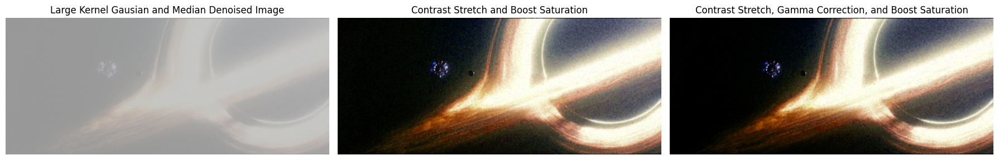

In [23]:
# Apply contrast stretch and boost saturation
increased_kernel_stretched = contrast_stretch_rgb(large_kernel_median_and_gaussian_denoised_img)
increased_kernel_stretched = boost_saturation_rgb(increased_kernel_stretched, s_gain=7.25)

# Apply contrast stretch, perfomr gamma correction and boost saturation
increased_kernel_filters = enhance_soft_rgb(large_kernel_median_and_gaussian_denoised_img, low_pct=10, high_pct=90,
                                    out_lo=0, out_hi=250, gamma=1.15, sat_gain=7.25)

# Create a figure with subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Display the contrast-enhanced original image
axs[0].imshow(large_kernel_median_and_gaussian_denoised_img)
axs[0].set_title("Large Kernel Gausian and Median Denoised Image")
axs[0].axis('off')

# Display the contrast-enhanced median denoised image
axs[1].imshow(increased_kernel_stretched)
axs[1].set_title("Contrast Stretch and Boost Saturation")
axs[1].axis('off')

# Display the contrast-enhanced median denoised image
axs[2].imshow(increased_kernel_filters)
axs[2].set_title("Contrast Stretch, Gamma Correction, and Boost Saturation")
axs[2].axis('off')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

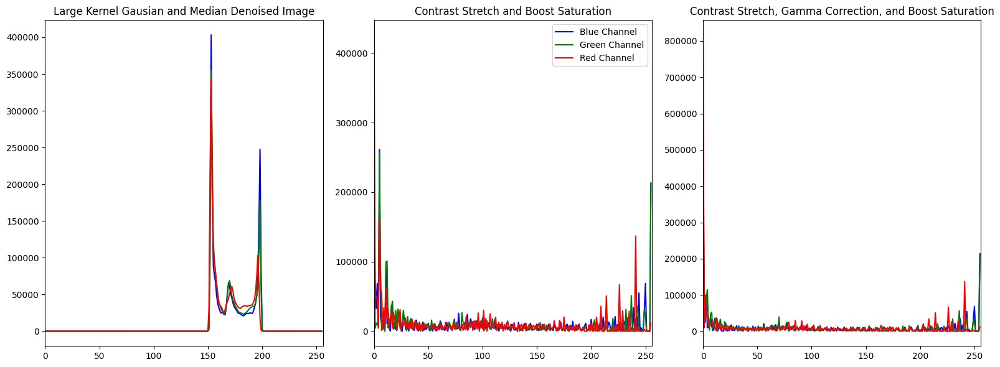

In [24]:
# View Image rgb channel histograms
red_hist_lkmgd, green_hist_lkmgd, blue_hist_lkmgd = calculate_histogram(large_kernel_median_and_gaussian_denoised_img)
red_hist_lkmgd_stretched, green_hist_lkmgd_stretched, blue_hist_lkmgd_stretched = calculate_histogram(increased_kernel_stretched)
red_hist_lkmgd_filters, green_hist_lkmgd_filters, blue_hist_lkmgd_filters = calculate_histogram(increased_kernel_filters)

# Create a figure with subplots
fig, ax = plt.subplots(1, 3, figsize=(16, 6))

ax[0].plot(red_hist_lkmgd, color='blue', label='Blue Channel')
ax[0].plot(green_hist_lkmgd, color='green', label='Green Channel')
ax[0].plot(blue_hist_lkmgd, color='red', label='Red Channel')
ax[0].set_title("Large Kernel Gausian and Median Denoised Image")
ax[0].set_xlim([0, 256])

ax[1].plot(red_hist_lkmgd_stretched, color='blue', label='Blue Channel')
ax[1].plot(green_hist_lkmgd_stretched, color='green', label='Green Channel')
ax[1].plot(blue_hist_lkmgd_stretched, color='red', label='Red Channel')
ax[1].set_title("Contrast Stretch and Boost Saturation")
ax[1].set_xlim([0, 256])
ax[1].legend()

ax[2].plot(red_hist_lkmgd_filters, color='blue', label='Blue Channel')
ax[2].plot(green_hist_lkmgd_filters, color='green', label='Green Channel')
ax[2].plot(blue_hist_lkmgd_filters, color='red', label='Red Channel')
ax[2].set_title("Contrast Stretch, Gamma Correction, and Boost Saturation")
ax[2].set_xlim([0, 256])

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

From the above images and the histograms we belive that the contrast stretched, gamma corrected, boosted saturation was closest to the original image seen in the problem description. With this we know know to apply the following filters to the template images in order to perform template matching:
1. Median Blur
2. Large Kernel (9,9) Gaussian Blur
3. Contrast Stretch
4. Gamma Correction for midtones
5. Increase saturation

In [25]:
cleaned_image = increased_kernel_filters
temp_001_img = cv.cvtColor(cv.imread(pre_template1_path), cv.COLOR_BGR2RGB)
temp_002_img = cv.cvtColor(cv.imread(pre_template2_path), cv.COLOR_BGR2RGB)
temp_003_img = cv.cvtColor(cv.imread(pre_template3_path), cv.COLOR_BGR2RGB)

# Applying to templates:
# Apply median noise reduction
temp_001_img_c = cv.medianBlur(temp_001_img, 5)
temp_002_img_c = cv.medianBlur(temp_002_img, 5)
temp_003_img_c = cv.medianBlur(temp_003_img, 5)


# Apply gaussian to template images
temp_001_img_c = cv.GaussianBlur(temp_001_img_c, (9, 9), 0)
temp_002_img_c = cv.GaussianBlur(temp_002_img_c, (9, 9), 0)
temp_003_img_c = cv.GaussianBlur(temp_003_img_c, (9, 9), 0)

# Apply contrast stretching and saturation boost to template images
temp_001_img_c = enhance_soft_rgb(temp_001_img_c, low_pct=10, high_pct=90,
                                    out_lo=0, out_hi=250, gamma=1.15, sat_gain=7.25)

temp_002_img_c = enhance_soft_rgb(temp_002_img_c, low_pct=10, high_pct=90,
                                    out_lo=0, out_hi=250, gamma=1.15, sat_gain=7.25)

temp_003_img_c = enhance_soft_rgb(temp_003_img_c, low_pct=10, high_pct=90,
                                    out_lo=0, out_hi=250, gamma=1.15, sat_gain=7.25)


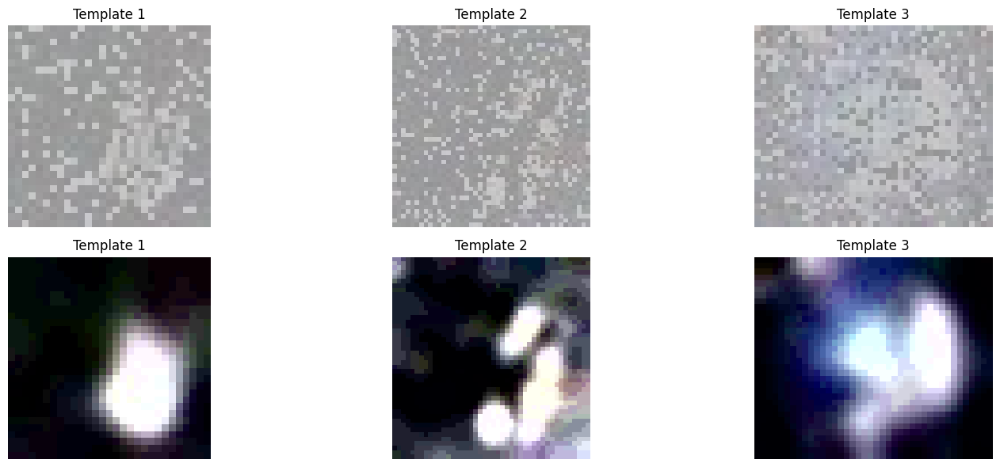

In [26]:
# Display resulting images:
fig, axs = plt.subplots(2, 3, figsize=(16, 6))

# Display template 1
axs[0][0].imshow(temp_001_img)
axs[0][0].set_title("Template 1")
axs[0][0].axis('off')

# Display template 2
axs[0][1].imshow(temp_002_img)
axs[0][1].set_title("Template 2")
axs[0][1].axis('off')

# Display template 3
axs[0][2].imshow(temp_003_img)
axs[0][2].set_title("Template 3")
axs[0][2].axis('off')


# Display template 1 corrected
axs[1][0].imshow(temp_001_img_c)
axs[1][0].set_title("Template 1")
axs[1][0].axis('off')

# Display template 2 corrected
axs[1][1].imshow(temp_002_img_c)
axs[1][1].set_title("Template 2")
axs[1][1].axis('off')

# Display template 3 corrected
axs[1][2].imshow(temp_003_img_c)
axs[1][2].set_title("Template 3")
axs[1][2].axis('off')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

In [27]:
def template_matching(image, template):
    image_gray = cv.cvtColor(image, cv.COLOR_RGB2GRAY)
    template_gray = cv.cvtColor(template, cv.COLOR_RGB2GRAY)

    h, w = template_gray.shape

    result = cv.matchTemplate(image_gray, template_gray, cv.TM_CCOEFF_NORMED)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)

    # The best match location is `max_loc` for TM_CCOEFF_NORMED
    top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    # Created output boxes
    # Prompted AI to help make them nice and uniform. Helped with formatting
    bbox = {
        "x": top_left[0],
        "y": top_left[1],
        "width": w,
        "height": h,
        "confidence": max_val
    }

    return bbox

def draw_bounding_box(image, bbox, name=None, color=(0, 0, 255), text_size=6, text_weight=16):
    cv.rectangle(image, (bbox["x"], bbox["y"]), (bbox["x"] + bbox["width"], bbox["y"] + bbox["height"]), color, 3)

    if name is not None:
        top_left = (bbox["x"], bbox["y"])
        cv.putText(image, name, (top_left[0], top_left[1] - 10),
                cv.FONT_HERSHEY_SIMPLEX, text_size, color, text_weight)

    return image

def print_bbox(name, bbox):
    print(f"{name} found at: x = {bbox['x']}, y = {bbox['y']}")
    print(f"  Box of width = {bbox['width']}, and height = {bbox['height']}")
    print(f"  Confidence of: {bbox['confidence']:.3f}\n")

In [28]:
bbox_matched_001 = template_matching(cleaned_image, temp_001_img_c)
bbox_matched_002 = template_matching(cleaned_image, temp_002_img_c)
bbox_matched_003 = template_matching(cleaned_image, temp_003_img_c)

# Print out Results
print_bbox("Template 1", bbox_matched_001)
print_bbox("Template 2", bbox_matched_002)
print_bbox("Template 3", bbox_matched_003)

Template 1 found at: x = 806, y = 331
  Box of width = 29, and height = 29
  Confidence of: 0.943

Template 2 found at: x = 1139, y = 427
  Box of width = 44, and height = 45
  Confidence of: 0.776

Template 3 found at: x = 835, y = 374
  Box of width = 40, and height = 34
  Confidence of: 0.958



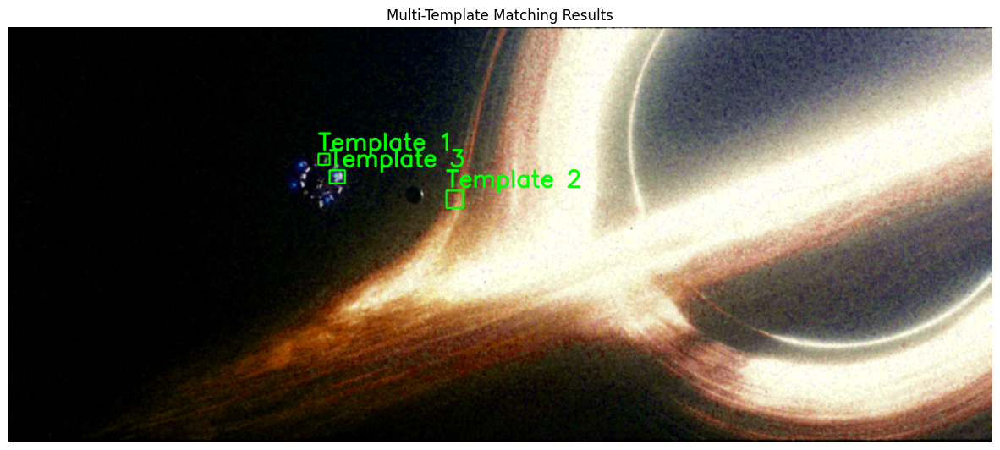

In [29]:
# Create copy of cleaned image to add boxes:
cleaned_image_copy = cleaned_image.copy()

# Place boxes on image copy
cleaned_image_copy = draw_bounding_box(cleaned_image_copy, bbox_matched_001, name="Template 1", color=(0, 255, 0), text_size=2, text_weight=6)
cleaned_image_copy = draw_bounding_box(cleaned_image_copy, bbox_matched_002, name="Template 2", color=(0, 255, 0), text_size=2, text_weight=6)
cleaned_image_copy = draw_bounding_box(cleaned_image_copy, bbox_matched_003, name="Template 3", color=(0, 255, 0), text_size=2, text_weight=6)

# Display cleaned_image_copy with results:
plt.figure(figsize=(15, 8))
plt.imshow(cleaned_image_copy)
plt.title('Multi-Template Matching Results')
plt.axis('off')
plt.show()

In [30]:
del(temp_001_img)
del(temp_002_img)
del(temp_003_img)
del(temp_001_img_c)
del(temp_002_img_c)
del(temp_003_img_c)
del(cleaned_image)
del(cleaned_image_copy)

## Question 4


In [31]:
# Q4 File Locations
q4_folder = "Question4"
scene_file = "output_smart.jpg"
star_template_1 = "output_smart_crop_001 (1).jpg"
star_template_2 = "output_smart_crop_002 (1).jpg"

scene_file_path = os.path.join(data_folder, q4_folder, scene_file)
star_template_1_path = os.path.join(data_folder, q4_folder, star_template_1)
star_template_2_path = os.path.join(data_folder, q4_folder, star_template_2)


In [32]:
 # Open images (in BGR)
original_scene = cv.imread(scene_file_path)
scene = original_scene.copy()
original_templates = [cv.imread(star_template_1_path), cv.imread(star_template_2_path)]
templates = [img.copy() for img in original_templates]
templates_name = ["Template 1", "Template 2"]

In [33]:
# Apply variety of improvements to the image (convert to grayscale, slightly blur the image to remove noise)

# Convert to grayscale for matching:
gray_scene = cv.cvtColor(scene, cv.COLOR_BGR2GRAY)
templates_gray = [cv.cvtColor(template, cv.COLOR_BGR2GRAY) for template in templates]

# Apply blur with small kernel size (can test larger kernel sizes)
blur_gray_scene = cv.medianBlur(gray_scene, 3)
templates_gray_blur = [cv.medianBlur(template, 3) for template in templates_gray]

# Apply clahe blur to scene and templates
clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_blur_gray_scene = clahe.apply(blur_gray_scene)
clahe_blur_templates_gray = [clahe.apply(template) for template in templates_gray_blur]


# Remove top and bottom percentage of pixels due to severe distortion (keep search confined to more of the middle belt)
# Exclude top and bottom 5%
h, w = clahe_blur_gray_scene.shape
five_percent_h = int(h * 0.05)

# Create a copy to modify for matching (we don't want to modify the visualization image)
scene_for_matching = clahe_blur_gray_scene.copy()

# Set top 5% of rows to black
scene_for_matching[0:five_percent_h, :] = 0
# Set bottom 5% of rows to black
scene_for_matching[h - five_percent_h:h, :] = 0

Since the original image is distorted around the top and bottom (as the problem stated) we can apply an adapted template search to search across different distortion levels. We can apply a continuos version of the scaling or a zoned version.

In the continuos scaling version we would apply cosine scaling (aided by AI to find the concept) every n vertical pixels traveled. In an equirectangular projection, the horizontal stretching is proportional to the secant of the lattitude, i.e. $\frac{1}{\cos(\text{latitude})}$ where at the center the latitude is 0 and at the poles the latitudes are -90 or 90 (south or north). At every additional pixel separation we will rescale the image by the stretch factor to extend the horizontal edge and shorten the vertical edge.

In the "zoned" or belt approach we would apply the rule above about cosine scaling but to set regions beforehand. Here we split the image into n horizontal strips and apply cosine scaling based on the center of the belt latitude. This saves computational resources running the template matching on every small slice would be expensive.

Since there is no time constraint here, we will try both methods to see which one outperforms the other.

In [34]:
def update_bbox(bbox, new_bbox):
    if new_bbox["confidence"] > bbox["confidence"]:
        return new_bbox

    return bbox

def template_matching_gray(image_gray, template_gray):
    h, w = template_gray.shape

    result = cv.matchTemplate(image_gray, template_gray, cv.TM_CCOEFF_NORMED)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)

    # The best match location is `max_loc` for TM_CCOEFF_NORMED
    top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    # Created output boxes
    # Prompted AI to help make them nice and uniform. Helped with formatting
    bbox = {
        "x": top_left[0],
        "y": top_left[1],
        "width": w,
        "height": h,
        "confidence": max_val
    }

    return bbox

def continuous_template_matching(scene_image, base_template, step_size=100):
    scene_height, scene_width = scene_image.shape
    template_height, template_width = base_template.shape

    # Variable to store the overall best match
    bbox = {
        "x": -1,
        "y": -1,
        "width": -1,
        "height": -1,
        "confidence": -1
    }

    # Slide a window from top to bottom
    for y_start in range(0, scene_height - template_height + 1, step_size):
        # Define the current horizontal slice of the scene
        y_end = y_start + template_height
        scene_slice = scene_image[y_start:y_end, :]

        # Calculate the stretch factor for the dead center of this slice
        center_y = y_start + template_height / 2
        latitude_rad = np.pi * (0.5 - center_y / scene_height)
        stretch_factor = 1.0 / (np.cos(latitude_rad) + 1e-6)

        # Apply the stretch to the base template
        new_width = int(template_width * stretch_factor)
        if new_width <= 0 or new_width > scene_width:
            continue

        stretched_template = cv.resize(
            base_template, (new_width, template_height), interpolation=cv.INTER_LINEAR
        )

        # Perform template matching only within this thin slice
        result = cv.matchTemplate(scene_image, stretched_template, cv.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)

        top_left = max_loc
        bottom_right = (top_left[0] + new_width, top_left[1] + template_height)

        # Created output boxes
        new_bbox = {
            "x": top_left[0],
            "y": top_left[1],
            "width": new_width,
            "height": template_height,
            "confidence": max_val
        }

        bbox = update_bbox(bbox, new_bbox)

    return bbox

def zoned_template_matching(scene_image, base_template, num_belts=7):
    scene_height, scene_width = scene_image.shape
    template_height, template_width = base_template.shape
    belt_height = scene_height // num_belts

    # Variable to store the overall best match
    bbox = {
        "x": -1,
        "y": -1,
        "width": -1,
        "height": -1,
        "confidence": -1
    }

    for i in range(num_belts):
        # Define the current belt
        y_start = i * belt_height
        y_end = (i + 1) * belt_height
        scene_belt = scene_image[y_start:y_end, :]

        # 2. Calculate the stretch factor for the center of this belt
        center_y = y_start + belt_height / 2

        # Convert pixel y-coordinate to latitude in radians
        # (latitude = 0 at H/2, +pi/2 at y=0, -pi/2 at y=H)
        latitude_rad = np.pi * (0.5 - center_y / scene_height)

        # Stretch factor is 1/cos(latitude). Add epsilon to avoid division by zero at poles.
        stretch_factor = 1.0 / (np.cos(latitude_rad) + 1e-6)


        # Apply the stretch to the base template
        new_width = int(template_width * stretch_factor)
        if new_width <= 0 or new_width > scene_width:
            continue # Skip if the new width is invalid

        stretched_template = cv.resize(
            base_template, (new_width, template_height), interpolation=cv.INTER_LINEAR
        )

        # Sanity check: ensure the stretched template fits in the belt
        if stretched_template.shape[1] > scene_belt.shape[1] or \
           stretched_template.shape[0] > scene_belt.shape[0]:
            continue

        # Perform template matching only within this belt
        result = cv.matchTemplate(scene_image, stretched_template, cv.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)

        top_left = max_loc
        bottom_right = (top_left[0] + new_width, top_left[1] + template_height)

        # Created output boxes
        new_bbox = {
            "x": top_left[0],
            "y": top_left[1],
            "width": new_width,
            "height": template_height,
            "confidence": max_val
        }

        bbox = update_bbox(bbox, new_bbox)

    return bbox



In [35]:
# Create base search with no consideration for stretching:
scene_copy = scene.copy()
bounding_boxes = {}


# Create copy of original image to add bounding boxes to found objects and create dictionary of bounding boxes
cont_scene_copy = scene.copy()
cont_bounding_boxes = {}

zoned_scene_copy = scene.copy()
zoned_bounding_boxes = {}


for template, template_name in zip(clahe_blur_templates_gray, templates_name):
    bbox = template_matching_gray(scene_for_matching, template)
    bounding_boxes[template_name] = bbox
    scene_copy = draw_bounding_box(scene_copy, bbox, name=template_name)

    cont_bbox = continuous_template_matching(scene_for_matching, template)
    cont_bounding_boxes[template_name] = cont_bbox
    cont_scene_copy = draw_bounding_box(cont_scene_copy, cont_bbox, name=template_name)

    zoned_bbox = zoned_template_matching(scene_for_matching, template)
    zoned_bounding_boxes[template_name] = zoned_bbox
    zoned_scene_copy = draw_bounding_box(zoned_scene_copy, zoned_bbox, name=template_name)

print("Results for Base Template Matching (no stretching):")
for name, box in bounding_boxes.items():
    print_bbox(name, box)
print()

print("Results for Continuos Stretching:")
for name, box in cont_bounding_boxes.items():
    print_bbox(name, box)
print()

print("Results for Zoned Stretching:")
for name, box in zoned_bounding_boxes.items():
    print_bbox(name, box)
print()



Results for Base Template Matching (no stretching):
Template 1 found at: x = 3633, y = 2712
  Box of width = 77, and height = 75
  Confidence of: 0.926

Template 2 found at: x = 5194, y = 2055
  Box of width = 80, and height = 75
  Confidence of: 0.910


Results for Continuos Stretching:
Template 1 found at: x = 3633, y = 2712
  Box of width = 77, and height = 75
  Confidence of: 0.926

Template 2 found at: x = 5194, y = 2055
  Box of width = 80, and height = 75
  Confidence of: 0.910


Results for Zoned Stretching:
Template 1 found at: x = 3634, y = 2712
  Box of width = 76, and height = 75
  Confidence of: 0.904

Template 2 found at: x = 5195, y = 2055
  Box of width = 79, and height = 75
  Confidence of: 0.903




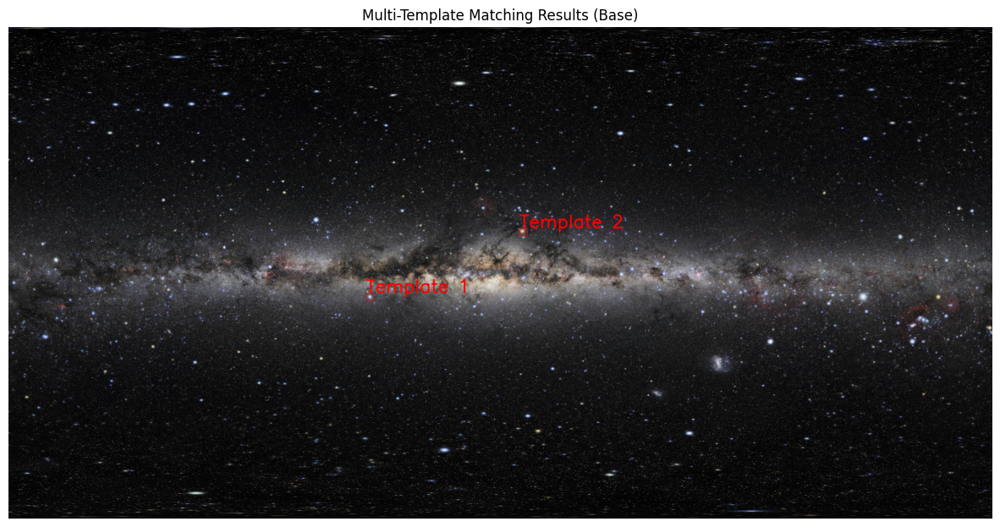

In [36]:
final_image_rgb = cv.cvtColor(scene_copy, cv.COLOR_BGR2RGB)

plt.figure(figsize=(15, 8))
plt.imshow(final_image_rgb)
plt.title('Multi-Template Matching Results (Base)')
plt.axis('off')
plt.savefig(data_folder + '/Q4_base_search_image.png')

plt.show()


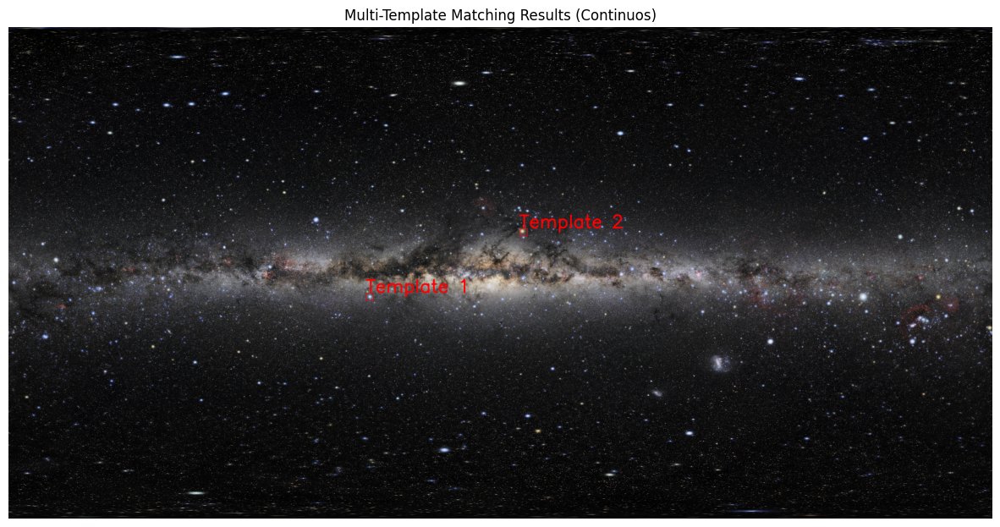

In [37]:
cont_final_image_rgb = cv.cvtColor(cont_scene_copy, cv.COLOR_BGR2RGB)

plt.figure(figsize=(15, 8))
plt.imshow(cont_final_image_rgb)
plt.title('Multi-Template Matching Results (Continuos)')
plt.axis('off')
plt.savefig(data_folder + '/Q4_continuous_stretch_search_image.png')
plt.show()

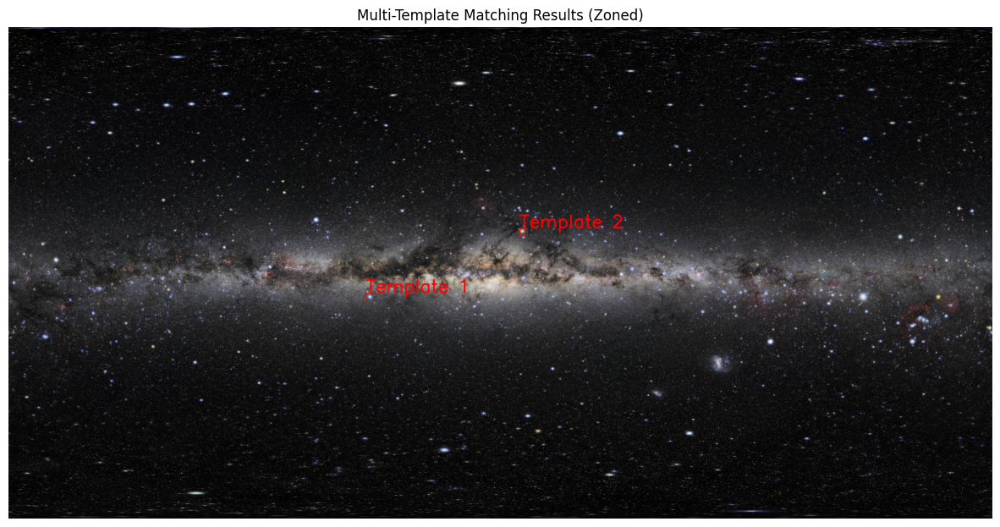

In [38]:
zoned_final_image_rgb = cv.cvtColor(zoned_scene_copy, cv.COLOR_BGR2RGB)

plt.figure(figsize=(15, 8))
plt.imshow(zoned_final_image_rgb)
plt.title('Multi-Template Matching Results (Zoned)')
plt.axis('off')
plt.savefig(data_folder + '/Q4_zoned_stretch_search_image.png')
plt.show()

Although we obtained the same results in the end, the methods where we utilized stretcing had more confidence about the image location.

## Save File as Pdf

In [39]:
from google.colab import drive
try:
    drive.mount('/content/drive')
except ValueError as e:
    print(f"Error mounting Google Drive: {e}")


data_folder = "/content/drive/MyDrive/Fall 2025/CS-GY 6643 Computer Vision/Project 1"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [40]:
%%capture
!sudo apt-get install pandoc
!pip install pypandoc
!sudo apt-get install texlive-xetex texlive-fonts-recommended texlive-plain-generic

In [41]:
!jupyter nbconvert --to pdf "/content/drive/MyDrive/Fall 2025/CS-GY 6643 Computer Vision/Project 1/Project 1.ipynb"

[NbConvertApp] Converting notebook /content/drive/MyDrive/Fall 2025/CS-GY 6643 Computer Vision/Project 1/Project 1.ipynb to pdf
[NbConvertApp] Support files will be in Project 1_files/
[NbConvertApp] Making directory ./Project 1_files
[NbConvertApp] Writing 150729 bytes to notebook.tex
[NbConvertApp] Building PDF
[NbConvertApp] Running xelatex 3 times: ['xelatex', 'notebook.tex', '-quiet']
[NbConvertApp] Running bibtex 1 time: ['bibtex', 'notebook']
[NbConvertApp] WARNING | bibtex had problems, most likely because there were no citations
[NbConvertApp] PDF successfully created
[NbConvertApp] Writing 7700052 bytes to /content/drive/MyDrive/Fall 2025/CS-GY 6643 Computer Vision/Project 1/Project 1.pdf
